<a href="https://colab.research.google.com/github/fbadine/notebooks/blob/master/Image_Spam_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Spam Detection Using CNN and Transfer learning

**Author:** [Fadi Badine](https://twitter.com/fadibadine)<br>
**Date created:** 20/10/2022<br>
**Last modified:** 22/10/2023<br>
**Description:** This notebook implements part of the Master's project entitled [Image Spam Classification using Deep Learning](https://scholarworks.sjsu.edu/cgi/viewcontent.cgi?article=1634&context=etd_projects).   
This updated version of document uses Keras 3 and can run on TensorFlow, JAX and PyTorch


## Install Prerequisits

For our project, we need to install Keras 3 and Keras CV. The latter is used for image augmentation.  
Due to a bug where Keras CV does not load when using Keras nightly, we will be using Keras Core.

An issue was reported to Keras CV team. Check out the issue [here](https://github.com/keras-team/keras-cv/issues/2111)

In [1]:
!pip install -q -U keras-core
!pip install -q -U keras-cv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 803.1/803.1 kB 6.0 MB/s eta 0:00:00


## Imports

In [2]:
# @title Select Backend to use
backend = 'tensorflow' # @param ["tensorflow", "jax"]

import os
os.environ["KERAS_BACKEND"] = backend

if backend == 'jax':
    os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]='0.87'

In [3]:
import sys
import seaborn as sns
import numpy as np
import tensorflow as tf
import keras_core as keras
import keras_cv

import matplotlib.pyplot as plt

Using TensorFlow backend


# Common Configurations and functions

In [4]:
# Where will the dataset be downloaded
DATASET_ROOT_DIR = "./dataset/"

# Image dimensions when cropping them
image_size = (256, 256)

# Batch size to use for training
batch_size = 128

# Percentage of data to use for validation
validation_split = 0.2

# TensorBord logs folder
ROOT_LOGDIR = os.path.join(os.curdir, "logs")

def get_run_logdir(model_name = "unknown"):
    return os.path.join(ROOT_LOGDIR, model_name)

# Reproduce the same results for each run
SEED = 1337
os.environ['PYTHONHASHSEED']=str(SEED)
keras.utils.set_random_seed(SEED)

The below function cleans a dataset folder from files that:


*   are corrupted
*   or do not have extension .jpg or .jpeg

This functions expects as argument, the dataset directory where there will be a list of directories, one for each category.

After finishing cleaning, this function returns the list of categories




In [5]:
def delete_corrupted_files(dataset_dir):
    # Get the list of directories in dataset_dir which is the list of categories
    categories = os.listdir(dataset_dir)

    num_skipped = 0

    for category in categories:
        folder_path = os.path.join(dataset_dir, category)
        for fname in os.listdir(folder_path):
            fpath = os.path.join(folder_path, fname)
            if fpath.rsplit('.', maxsplit=1)[1].lower() in ['jpg', 'jpeg']:
                try:
                    fobj = open(fpath, "rb")
                    is_jfif = tf.compat.as_bytes('JFIF') in fobj.peek(10)
                finally:
                    fobj.close()
            else:
                # Deleting files that do not have .jpg or .jpeg
                num_skipped += 1
                print(f"Deleting file {fpath}")
                os.remove(fpath)

            if not is_jfif:
                num_skipped += 1
                print(f"Deleting file {fpath}")
                os.remove(fpath)

    print(f"Deleted {num_skipped} images")

    return categories

# Image Spam Hunter Dataset

In [6]:
DATASET_DIR = os.path.join(DATASET_ROOT_DIR, "image_spam_hunter")

SPAM_URL = "http://www.cs.northwestern.edu/~yga751/ML/SpamImages.zip"
SPAM_ZIP_FILE = "SpamImages.zip"

HAM_URL = "http://www.cs.northwestern.edu/~yga751/ML/NaturalImages.zip"
HAM_ZIP_FILE = "NaturalImages.zip"

## Download

In [7]:
if os.path.isdir(DATASET_DIR) is False:
    print(f"Directory {DATASET_DIR} does not exist, creating it ... ")
    os.makedirs(DATASET_DIR)
else:
    print(f"Directory {DATASET_DIR} already exists ... ")

Directory ./dataset/image_spam_hunter does not exist, creating it ... 


In [8]:
!wget {SPAM_URL}
!unzip -qq {SPAM_ZIP_FILE} -d {DATASET_DIR}
!rm -rf {SPAM_ZIP_FILE}

!wget {HAM_URL}
!unzip -qq {HAM_ZIP_FILE} -d {DATASET_DIR}
!rm -rf {HAM_ZIP_FILE}

--2023-10-22 17:02:07--  http://www.cs.northwestern.edu/~yga751/ML/SpamImages.zip
Resolving www.cs.northwestern.edu (www.cs.northwestern.edu)... 165.124.180.20
Connecting to www.cs.northwestern.edu (www.cs.northwestern.edu)|165.124.180.20|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: http://users.cs.northwestern.edu/~yga751/ML/SpamImages.zip [following]
--2023-10-22 17:02:07--  http://users.cs.northwestern.edu/~yga751/ML/SpamImages.zip
Resolving users.cs.northwestern.edu (users.cs.northwestern.edu)... 165.124.180.20
Reusing existing connection to www.cs.northwestern.edu:80.
HTTP request sent, awaiting response... 302 Found
Location: https://users.cs.northwestern.edu/~yga751/ML/SpamImages.zip [following]
--2023-10-22 17:02:07--  https://users.cs.northwestern.edu/~yga751/ML/SpamImages.zip
Connecting to users.cs.northwestern.edu (users.cs.northwestern.edu)|165.124.180.20|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 37267920 (36M

## Cleaning dataset from corrupted files

In [9]:
dataset_categories = delete_corrupted_files(os.path.join(DATASET_DIR))
print(f"Files categories are: {dataset_categories}")

Deleting file ./dataset/image_spam_hunter/NaturalImages/Thumbs.db
Deleting file ./dataset/image_spam_hunter/SpamImages/clothes1.jpg
Deleting file ./dataset/image_spam_hunter/SpamImages/debut.jpg
Deleting file ./dataset/image_spam_hunter/SpamImages/birdbath.jpg
Deleting file ./dataset/image_spam_hunter/SpamImages/shoes1.jpg
Deleting file ./dataset/image_spam_hunter/SpamImages/oily1.jpg
Deleting file ./dataset/image_spam_hunter/SpamImages/booties1.jpg
Deleting file ./dataset/image_spam_hunter/SpamImages/valentine1.jpg
Deleting file ./dataset/image_spam_hunter/SpamImages/bras1.jpg
Deleting file ./dataset/image_spam_hunter/SpamImages/veehaitch1.jpg
Deleted 10 images
Files categories are: ['NaturalImages', 'SpamImages']


## Create dataset

In [10]:
train_ds = keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=validation_split,
    subset="training",
    seed=SEED,
    image_size=image_size,
    batch_size=batch_size
)

valid_ds = keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=validation_split,
    subset="validation",
    seed=SEED,
    image_size=image_size,
    batch_size=batch_size
)

Found 1731 files belonging to 2 classes.
Using 1385 files for training.
Found 1731 files belonging to 2 classes.
Using 346 files for validation.


## Display samples

In [11]:
def visualise_dataset(dataset):
    fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(16, 16))

    for x, y in dataset.take(1):
        for i, axi in enumerate(ax.flat):
            axi.imshow(x[i].numpy().astype("uint8"))
            axi.set_title(dataset_categories[int(y[i])])

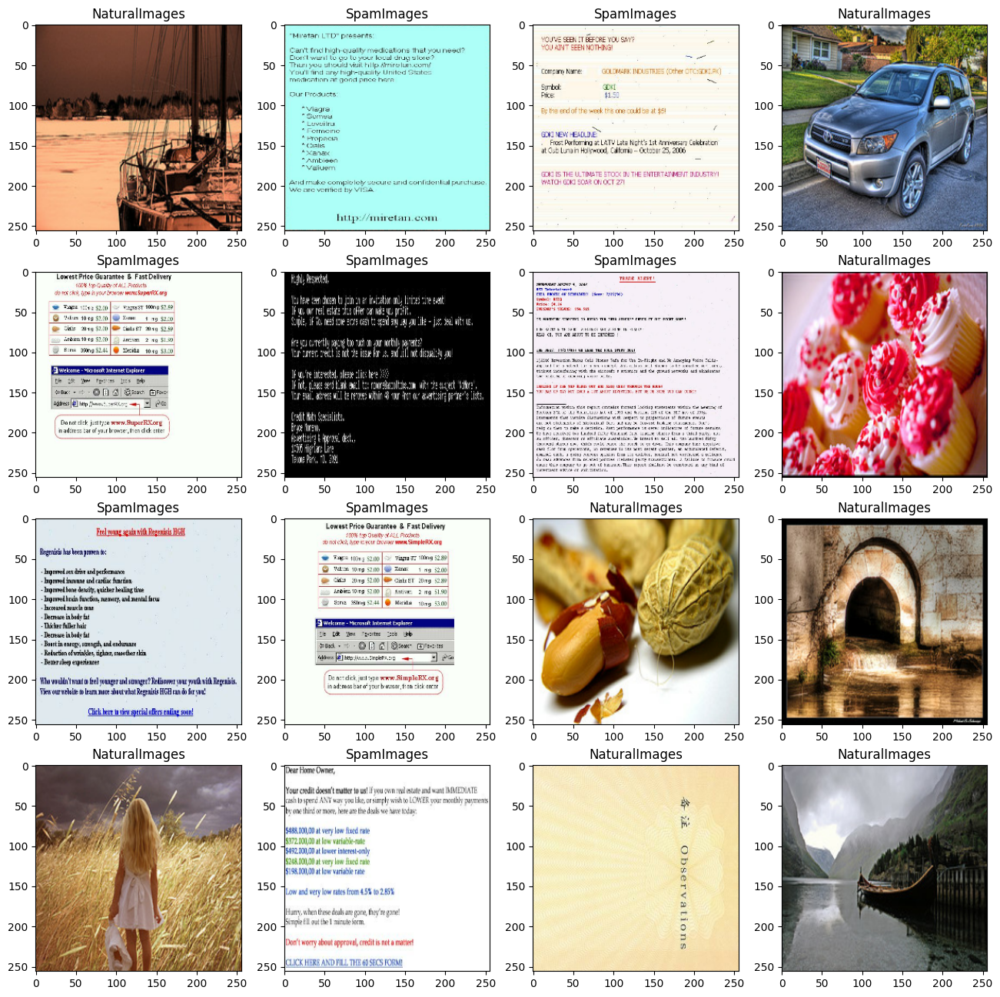

In [12]:
visualise_dataset(train_ds)

## Data augmentation

In [13]:
rand_augment = keras_cv.layers.RandAugment(
    value_range=(0,255),
    augmentations_per_image=3,
    magnitude=0.3,
    magnitude_stddev=0.2,
    rate=0.5
)

train_ds = train_ds.map(lambda x, y: (rand_augment(x), y)).prefetch(tf.data.AUTOTUNE)
valid_ds = valid_ds.map(lambda x, y: (rand_augment(x), y)).prefetch(tf.data.AUTOTUNE)

# Model

In this notebook, we will use transfer learning to build our deep CNN.
VGG19 will be used as the base model

## VGG 19 Model

In [14]:
# Import VGG19 pretrained on Imagenet without the top dense layers
vgg19_base_model = keras.applications.VGG19(include_top=False)

# Freeze the CNN layers so that we do not mess with the pretrained model.
# We will only train the dense layers that we will add on top
vgg19_base_model.trainable = False

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


## Preprocessing Model
We need some preprocessing layers in order to rescale and resize our images loaded from the dataset.  
For this, we will create a Sequential model

In [15]:
# A preprocessing model that does the following:
# - Rescaling to have tensors values in the range of [0 - 1]
# - Resizing to (256, 256, 3). This is especially for inference when we get any size
preprocessing_model = keras.Sequential([
    keras.layers.Rescaling(1./255),
    keras.layers.Resizing(
        height=image_size[0], width=image_size[1], crop_to_aspect_ratio=True
    )
])

## Full Model
Let's now create our full model consisting of:
*   Preprocessing model
*   VGG19 model
*   Couple of dense and dropout layers and an output layer

Along with the accuracy, we will be tracking the TP, TN, FP and FN metrics in order to better assess how well our model is performing.

In [16]:
def create_model(
    preprocessing_model,
    base_model,
    lr = 1e-3
):
    initialiser = keras.initializers.GlorotUniform(seed=SEED)

    # The input size will be defined in the Resizing layer within the preprocessing_model
    inputs = keras.layers.Input(shape=[None, None, 3])

    # Preprocessing model
    x = preprocessing_model(inputs)

    # VGG19
    x = base_model(x)

    # Dense Model
    x = keras.layers.Flatten()(x)
    x = keras.layers.Dense(1024, activation="relu", kernel_initializer = initialiser)(x)
    x = keras.layers.Dropout(0.3)(x)
    x = keras.layers.Dense(512, activation="relu", kernel_initializer = initialiser)(x)

    outputs = x = keras.layers.Dense(1, activation="sigmoid", kernel_initializer = initialiser)(x)

    model = keras.Model(inputs, outputs)

    metrics = [
        "accuracy",
        keras.metrics.TruePositives(name="TP"),
        keras.metrics.TrueNegatives(name="TN"),
        keras.metrics.FalsePositives(name="FP"),
        keras.metrics.FalseNegatives(name="FN")
    ]

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=lr),
        loss="binary_crossentropy",
        metrics=metrics
    )

    return model

In [17]:
model = create_model(preprocessing_model, vgg19_base_model)

In [18]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Layer (type)                       ┃ Output Shape                  ┃     Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)         │ (None, None, None, 3)         │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ sequential (Sequential)            │ (None, 256, 256, 3)           │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ vgg19 (Functional)                 │ (None, 8, 8, 512)             │  20,024,384 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ flatten (Flatten)                  │ (None, 32768)                 │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dense (Dense)                      │ (None, 1024)                  │  33,555,456 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dropout (Dropout)                  │ (None, 1024)                  │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dense_1 (Dense)                    │ (None, 512)                   │     524,800 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dense_2 (Dense)                    │ (None, 1)                     │         513 │
└────────────────────────────────────┴───────────────────────────────┴─────────────┘

 Total params: 54,105,153 (206.39 MB)

 Trainable params: 34,080,769 (130.01 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

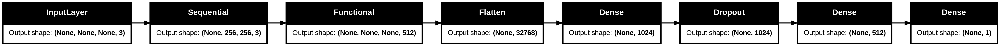

In [19]:
keras.utils.plot_model(model, show_shapes=True, rankdir='LR')

## Callbacks

Let's add some callback in order to allow for early stopping in case the model is not improving anymore. For this, we will be monitoring the validation loss.

Let's also intialise TensorBoard in order to visualise the training and validation metrics

In [20]:
log_dir = get_run_logdir("vgg19")
tensorboard_cb = keras.callbacks.TensorBoard(log_dir)

early_stopping_cb = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint(filepath="image_spam_detection.keras", save_best_only=True)

callbacks = [tensorboard_cb, early_stopping_cb, model_checkpoint_cb]

## Training

In [21]:
history = model.fit(
    train_ds,
    epochs=50,
    validation_data=valid_ds,
    callbacks=callbacks
)

Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 200s 13s/step - FN: 116.5000 - FP: 86.5833 - TN: 294.1667 - TP: 320.2500 - accuracy: 0.6834 - loss: 2.1142 - val_FN: 15.0000 - val_FP: 2.0000 - val_TN: 169.0000 - val_TP: 160.0000 - val_accuracy: 0.9513 - val_loss: 0.4417
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 32s 3s/step - FN: 8.0833 - FP: 17.5000 - TN: 356.0833 - TP: 435.8333 - accuracy: 0.9712 - loss: 0.2786 - val_FN: 5.0000 - val_FP: 5.0000 - val_TN: 166.0000 - val_TP: 170.0000 - val_accuracy: 0.9696 - val_loss: 0.2508
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - FN: 9.6667 - FP: 10.5833 - TN: 367.6667 - TP: 429.5833 - accuracy: 0.9719 - loss: 0.2629 - val_FN: 5.0000 - val_FP: 3.0000 - val_TN: 168.0000 - val_TP: 170.0000 - val_accuracy: 0.9781 - val_loss: 0.2244
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - FN: 6.8333 - FP: 10.7500 - TN: 369.5000 - TP: 430.4167 - accuracy: 0.9802 - loss: 0.1540 - val_FN: 2.0000 - val_FP: 4.0000 - val_TN: 167.0000 - val_TP: 173.0000 - val_accuracy: 0

## Evaluation

In [22]:
model.evaluate(valid_ds)

3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - FN: 1.0000 - FP: 2.0000 - TN: 129.0000 - TP: 137.0000 - accuracy: 0.9894 - loss: 0.0555


[0.05021361634135246, 1.0, 3.0, 168.0, 174.0, 0.9884838461875916]

In [23]:
best_model = keras.models.load_model("image_spam_detection.keras")
best_model.evaluate(valid_ds, return_dict=True)

/usr/local/lib/python3.10/dist-packages/keras_core/src/saving/saving_lib.py:347: UserWarning: Skipping variable loading for optimizer 'adam', because it has 78 variables whereas the saved optimizer has 14 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - FN: 0.5000 - FP: 4.5000 - TN: 126.5000 - TP: 137.5000 - accuracy: 0.9794 - loss: 0.0681


{'FN': 1.0,
 'FP': 5.0,
 'TN': 166.0,
 'TP': 174.0,
 'accuracy': 0.982175886631012,
 'loss': 0.07154911756515503}

11/11 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step


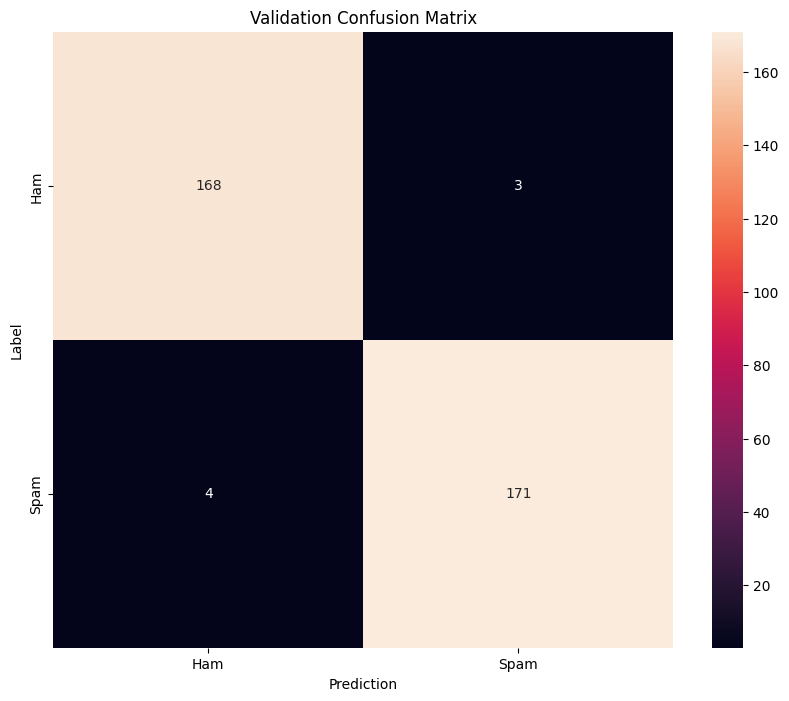

In [24]:
# Create x and y tensors
x_valid = None
y_valid = None

for x, y in iter(valid_ds):
    if x_valid is None:
        x_valid = x.numpy()
        y_valid = y.numpy()
    else:
        x_valid = np.concatenate((x_valid, x.numpy()), axis=0)
        y_valid = np.concatenate((y_valid, y.numpy()), axis=0)

# Generate predictions
y_pred = best_model.predict(x_valid).squeeze()
y_pred = np.where(y_pred > 0.5, 1, 0)

# Calculate confusion matrix
confusion_mtx = tf.math.confusion_matrix(y_valid, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    confusion_mtx, xticklabels=['Ham', 'Spam'], yticklabels=['Ham', 'Spam'], annot=True, fmt="g"
)
plt.xlabel("Prediction")
plt.ylabel("Label")
plt.title("Validation Confusion Matrix")
plt.show()

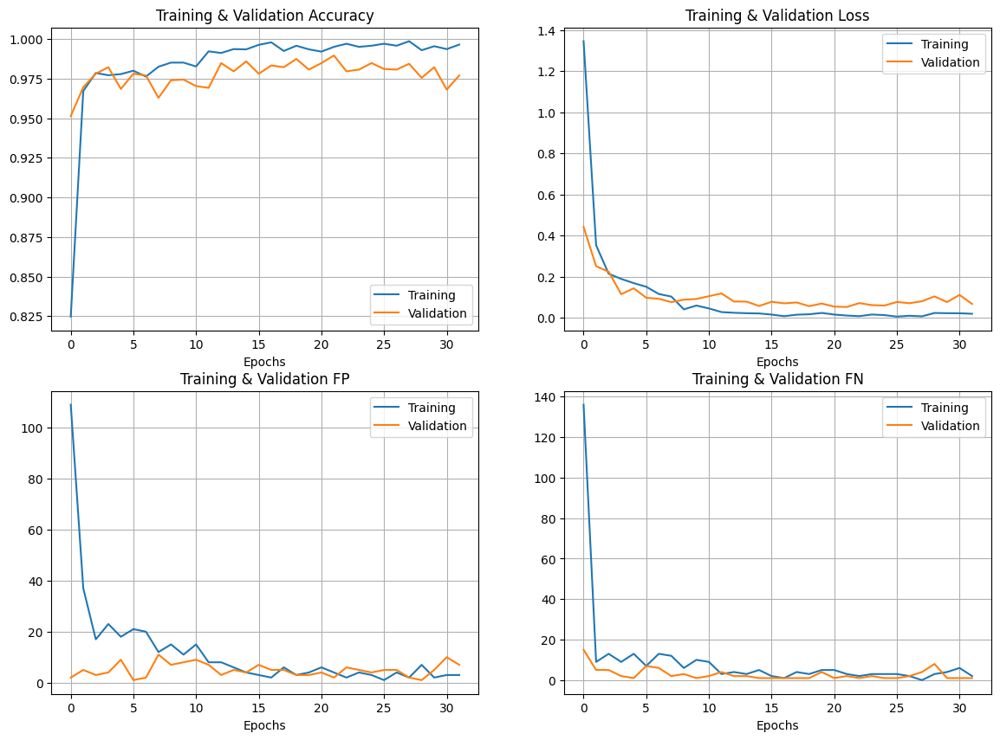

In [25]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))

EPOCHS=len(history.history['loss'])

axs[0][0].plot(range(EPOCHS), history.history["accuracy"], label="Training")
axs[0][0].plot(range(EPOCHS), history.history["val_accuracy"], label="Validation")
axs[0][0].set_xlabel("Epochs")
axs[0][0].set_title("Training & Validation Accuracy")
axs[0][0].legend()
axs[0][0].grid(True)

axs[0][1].plot(range(EPOCHS), history.history["loss"], label="Training")
axs[0][1].plot(range(EPOCHS), history.history["val_loss"], label="Validation")
axs[0][1].set_xlabel("Epochs")
axs[0][1].set_title("Training & Validation Loss")
axs[0][1].legend()
axs[0][1].grid(True)

axs[1][0].plot(range(EPOCHS), history.history["FP"], label="Training")
axs[1][0].plot(range(EPOCHS), history.history["val_FP"], label="Validation")
axs[1][0].set_xlabel("Epochs")
axs[1][0].set_title("Training & Validation FP")
axs[1][0].legend()
axs[1][0].grid(True)

axs[1][1].plot(range(EPOCHS), history.history["FN"], label="Training")
axs[1][1].plot(range(EPOCHS), history.history["val_FN"], label="Validation")
axs[1][1].set_xlabel("Epochs")
axs[1][1].set_title("Training & Validation FN")
axs[1][1].legend()
axs[1][1].grid(True)

plt.show()

In [26]:
%load_ext tensorboard
%tensorboard --logdir=logs --port=6006

<IPython.core.display.Javascript object>

# Note

Although Keras 3 supports TensorFlow, JAX and PyTorch, this notebook was successfully tested on TensorFlow and JAX only. This is way, the dropdown selection does not show `torch` as an option. We will add this in a later version.

A lot of enhancements could be made on this to fully implement the paper mentioned at the beginning of the notes. This was only a sample imaplementation.